In [1]:
%matplotlib notebook

%matplotlib inline

In [2]:
import pandas as pd
import numpy as np

from synthesize import SyntheticEmpiricalDataset, sample_gaussian, sample_truncated_gaussian
from scipy.stats import gamma, bernoulli

In [3]:
def synthesize_average_expressions(num_genes, cell_type_variation_probabilities, shape_parameter, normalize=True):
    """Synthesize related metagenes according to the metagene_variation_probabilities vector.

    """
    
    num_cell_type_components = len(cell_type_variation_probabilities) 
    expression_profiles = np.zeros((num_cell_type_components, num_genes))
    
    for index in range(num_cell_type_components):
        variation_probability = cell_type_variation_probabilities[index]
        if variation_probability == 0:
            expression_profile = gamma.rvs(shape_parameter, size=num_genes)
            expression_profiles[index] = expression_profile
        else:
            rng = np.random.default_rng()
            mask = rng.choice(num_genes, size=int(num_genes * variation_probability), replace=False)

            perturbed_expression_profile = np.array(expression_profile)
            perturbed_expression_profile[mask] = gamma.rvs(shape_parameter, size=len(mask))
        
            expression_profiles[index] = perturbed_expression_profile
        
            
    print("Difference between Inhibitory 1 and Inhibitory 2: %f" % ((expression_profiles[0] != expression_profiles[1]).sum() / num_genes))
    print("Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: %f" % ((expression_profiles[2] != expression_profiles[3]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L2: %f" % ((expression_profiles[4] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L2: %f" % ((expression_profiles[6] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L4: %f" % ((expression_profiles[4] != expression_profiles[7]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L4: %f" % ((expression_profiles[6] != expression_profiles[7]).sum() / num_genes))

    return expression_profiles

In [4]:
layer_distributions = [
    pd.Series(data=
        dict(zip(["Excitatory L1", "Inhibitory 1", "Non-Neuron L1", "Non-Neuron Ubiquitous"],
                 [0.33, 0.1, 0.5, 0.07]))),
    pd.Series(data=
        dict(zip(["Excitatory L2","Non-Neuron Ubiquitous"],
                 [0.93, 0.07]))),
    pd.Series(data=
        dict(zip(["Excitatory L3", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
                 [0.53, 0.1, 0.3, 0.07]))),
    pd.Series(data=
        dict(zip(["Excitatory L4", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
                 [0.73, 0.1, 0.1, 0.07]))),        
]
layer_distributions

[Excitatory L1            0.33
 Inhibitory 1             0.10
 Non-Neuron L1            0.50
 Non-Neuron Ubiquitous    0.07
 dtype: float64,
 Excitatory L2            0.93
 Non-Neuron Ubiquitous    0.07
 dtype: float64,
 Excitatory L3            0.53
 Inhibitory 1             0.10
 Inhibitory 2             0.30
 Non-Neuron Ubiquitous    0.07
 dtype: float64,
 Excitatory L4            0.73
 Inhibitory 1             0.10
 Inhibitory 2             0.10
 Non-Neuron Ubiquitous    0.07
 dtype: float64]

In [5]:
layer_distributions[2]

Excitatory L3            0.53
Inhibitory 1             0.10
Inhibitory 2             0.30
Non-Neuron Ubiquitous    0.07
dtype: float64

In [6]:
def make_cell_type_dataframe(expression_profiles, cell_type_names):
    nonzero_index, = np.where(expression_profiles.sum(axis=0) != 0)
    dataframe = pd.DataFrame(data=expression_profiles[:, nonzero_index], columns=cell_type_names)
    
    return dataframe

In [7]:
class SyntheticMetageneFreeCortexDataset(SyntheticEmpiricalDataset):
    """Synthetic mouse brain cortex dataset with ciruclar pattterns.
    
    This class provides methods for initializing a semi-random mouse cortex spatial
    transcriptomics dataset, as well as methods to visualize aspects of the dataset.
    
    Data consists of 4 layers of widths [.35, .15, .25, .25]. Each layer has a
    unique excitatory neuronal type. There are three inhibitory neuronal
    types which have slight layer preferences. There are two layer-specific
    non-neuron types, one of which constitutes most of layer 2. There is a
    third non-neuron type, which is uniformly distributed throughout.
    0 - Excitatory L1
    1 - Excitatory L2
    2 - Excitatory L3
    3 - Excitatory L4
    4 - Inhibitory 1
    5 - Inhibitory 2
    6 - non-Neuron L1
    7 - non-Neuron (ubiquitous)

    Metagenes
    0 - Excitatory
    1 - In
    2 - Inhibitory-1
    3 - Inhibitory-2
    4 - non-Neuron 1
    5 - non-Neuron 2
    6 - L3
    7 - L4
    8 - L1
    9 - L2
    10 - end - random
    """
    
    distributions = layer_distributions
    
    layer_widths = np.array([0.35, 0.15, 0.25, 0.25])# * np.sqrt(2)
    layer_endpoints = np.cumsum(layer_widths)
    
    mask_conditions = [
        (lambda coordinates: coordinates[:, 0] < SyntheticMetageneFreeCortexDataset.layer_endpoints[0]),
#         *[(lambda coordinates: (np.linalg.norm(coordinates, axis=1) >= SyntheticAMBACortexDataset.layer_endpoints[layer])
#              & (np.linalg.norm(coordinates, axis=1) < SyntheticAMBACortexDataset.layer_endpoints[layer + 1]))
#             for layer in range(0, 7)
#          ],
        (lambda coordinates: (coordinates[:, 0] >= SyntheticMetageneFreeCortexDataset.layer_endpoints[0])
             & (coordinates[:, 0] < SyntheticMetageneFreeCortexDataset.layer_endpoints[1])),
        (lambda coordinates: (coordinates[:, 0] >= SyntheticMetageneFreeCortexDataset.layer_endpoints[1])
             & (coordinates[:, 0] < SyntheticMetageneFreeCortexDataset.layer_endpoints[2])),
        (lambda coordinates: coordinates[:, 0] >= SyntheticMetageneFreeCortexDataset.layer_endpoints[2])
    ]
    
    cell_composition_variation_probabilities = [0, 0.1, 0, 0.1, 0, 0.05, 0.05, 0.01]
    
    cell_type_compositions = np.array([
        [   # Layer 1
            [0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0, 0], # Non-Neuron 2
            [0, 0, 1, 0, 0, 0, 0, 0] 
        ],
        [   # Layer 2
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 1], # Excitatory L2
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0]   
        ],
        [   # Layer 3
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 1, 0, 0, 0], # Excitatory L3
            [0, 0, 0, 0, 0, 0, 0, 0],
            [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
            [0, 1, 0, 0, 0, 0, 0, 0], # Inhibitory 2
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0]   
        ],
        [   # Layer 4
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 0, 0], # Excitatory L4
            [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
            [0, 1, 0, 0, 0, 0, 0, 0], # Inhibitory 2
            [0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0]   
        ]
    ])
    
    

    def __init__(self, parameters, parent_directory, key=''):
        num_genes = parameters["num_genes"]
        
        gene_names = ["Gene {}".format(gene) for gene in np.arange(num_genes)]

        cell_composition_definitions = synthesize_average_expressions(num_genes, SyntheticMetageneFreeCortexDataset.cell_composition_variation_probabilities, parameters["gamma_shape"])
        
        cell_type_definitions = [np.dot(cell_type_composition, cell_composition_definitions).T for cell_type_composition in SyntheticMetageneFreeCortexDataset.cell_type_compositions]
        cell_type_definitions = [make_cell_type_dataframe(cell_type_definition, layer_distribution.index)
                                     for cell_type_definition, layer_distribution in zip(cell_type_definitions, layer_distributions)]
        super().__init__(SyntheticMetageneFreeCortexDataset.distributions,
                         cell_type_definitions,
                         [gene_names for _ in layer_distributions],
                         SyntheticMetageneFreeCortexDataset.mask_conditions,
                         parameters, parent_directory, key='')
        

In [8]:
for layer_distribution in layer_distributions:
    print(layer_distribution)

Excitatory L1            0.33
Inhibitory 1             0.10
Non-Neuron L1            0.50
Non-Neuron Ubiquitous    0.07
dtype: float64
Excitatory L2            0.93
Non-Neuron Ubiquitous    0.07
dtype: float64
Excitatory L3            0.53
Inhibitory 1             0.10
Inhibitory 2             0.30
Non-Neuron Ubiquitous    0.07
dtype: float64
Excitatory L4            0.73
Inhibitory 1             0.10
Inhibitory 2             0.10
Non-Neuron Ubiquitous    0.07
dtype: float64


In [9]:
##### Create Datasets
parent_directory = "../../data/synthetic_metagene_free_cortex"
cell_type_names = [
    "Excitatory L1",
    "Excitatory L2",
    "Excitatory L3",
    "Excitatory L4",
    "Non-Neuron L1",
    "Non-Neuron Ubiquitous",
    "Inhibitory 1",
    "Inhibitory 2",
]

max_variances_low = np.array([
    3.0,
    5.0,
    5.0,
    5.0,
    5.0,
    5.0,
    4.0,
    3.0,
])

max_variances_medium = np.array([
    15.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    20.0,
    15.0,
])

max_variances_high = np.array([
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
])

max_variances_extreme = np.array([
    30.0,
    50.0,
    50.0,
    50.0,
    30.0,
    50.0,
    25.0,
    30.0,
])

def generate_symmetric_random_matrix(low, high, shape):
    rng = np.random.default_rng()
    matrix = rng.uniform(low, high, shape)
    
    return (matrix + matrix.T) / 2

def generate_covariance_matrix(max_variance, low, high, shape):
    rng = np.random.default_rng()
    
    covariance = generate_symmetric_random_matrix(low, high, shape)
    variance = rng.uniform(0, max_variance, shape[:1])
    
    covariance_matrix = covariance + np.identity(shape[0]) * variance
    plt.imshow(covariance_matrix)
    plt.show()
    
    return covariance_matrix

In [10]:
"""
Random Correlation matrix using the algorithm in LKJ 2009 (vine method based on a C-vine)
Created on Wed Aug  2 09:09:02 2017
@author: junpenglao
"""
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

def lkj_random(n, beta, size=1):
#     beta = eta - 1 + n/2
    shape = n * (n-1) // 2
    triu_ind = np.triu_indices(n, 1)
    beta_parameters = np.array([beta - k/2 for k in triu_ind[0]])
    # partial correlations sampled from beta dist.
    P = np.ones((n, n) + (size,))
    P[triu_ind] = stats.beta.rvs(a=beta, b=beta, size=(size,) + (shape,)).T
    # scale partial correlation matrix to [-1, 1]
    P = (P-.5)*2
    
    for k, i in zip(triu_ind[0], triu_ind[1]):
        p = P[k, i]
        for l in range(k-1, -1, -1):  # convert partial correlation to raw correlation
            p = p * np.sqrt((1 - P[l, i]**2) *
                            (1 - P[l, k]**2)) + P[l, i] * P[l, k]
        P[k, i] = p
        P[i, k] = p

    covariance = np.transpose(P, (2, 0 ,1))

        
    return np.squeeze(covariance)

In [11]:
covariance = lkj_random(100, 100, size=1)
print(np.diag(covariance, -1))

[-2.83083204e-02  1.12210969e-01  2.27464673e-02  7.08418596e-03
  1.33350426e-01  1.04059281e-04 -5.41152700e-02 -1.22856968e-01
  1.20085189e-01 -6.93734260e-02  7.31777336e-02  4.55947878e-02
 -1.81962710e-02  7.35876965e-02  1.28873392e-01  6.95012292e-03
  9.30511409e-02  1.98372971e-02  1.02073928e-01  1.41795082e-03
  2.21512194e-02  6.51228351e-02  1.17635165e-01  1.34927210e-01
  1.68292547e-02 -2.81999029e-02 -5.04300030e-02 -7.68151778e-03
  6.35170965e-03  5.67646008e-02  4.76433435e-02 -6.68639162e-02
  1.61251828e-02  1.38047686e-01 -6.33712898e-03 -1.15674235e-01
  2.21561821e-02  1.28903646e-02 -4.96641574e-02 -9.57040312e-03
 -1.07361112e-01 -1.88880264e-02 -8.30243758e-02 -2.16229823e-02
  3.27456784e-02  2.27515777e-02 -2.78516184e-02  4.94719442e-02
 -3.96454853e-02  1.39138313e-02  5.05741908e-02 -8.64560525e-02
  1.49181114e-02 -3.89857043e-03 -1.35574584e-01 -1.19799990e-01
 -2.21467630e-02 -1.31169512e-01  5.25076492e-02  5.94615514e-02
 -1.42599364e-01 -5.04699

In [12]:
parent_directory = "../../data/synthetic_metagene_free_cortex"
num_runs = 10
datasets = []
variance_options = {
    #"low": max_variances_low, 
    #"medium": max_variances_medium,
    #"high": max_variances_high,
    "extreme": max_variances_extreme
}
beta_options = {
    "low": 100,
    "medium": 10,
}

for variance_option, variances in variance_options.items():
    for beta_option, beta in beta_options.items():
        for run in range(num_runs):
            np.random.seed(run)
            covariance_matrices = 100 / 50 * variances[:, np.newaxis, np.newaxis] * lkj_random(100, beta, size=len(cell_type_names))
        
            noise_levels = []
            for covariance_matrix in covariance_matrices:
                covariance_matrix = covariance_matrices

                eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)
                noise = eigenvalues.sum() / 100
                noise_levels.append(noise)

            noise = np.mean(noise_levels).astype(int)

            parameters = {
                "name": f"{variance_option}_variance_{beta_option}_covariance_random_seed_{run}",
                'num_cells': 500,
                'num_genes': 100,
                'num_replicates': 2,
                'sigY_scale': {
                    cell_type: covariance_matrix for cell_type, covariance_matrix in zip(cell_type_names, covariance_matrices)
                },
                "gamma_shape": 4.0,
                'lambda_s': 1.0
            }

            print(parameters["name"])
            print(noise)

            subdirectory = f'{parent_directory}/{parameters["num_cells"]}_cells_{parameters["num_genes"]}_genes_{parameters["name"]}'
            dataset = SyntheticMetageneFreeCortexDataset(parameters, subdirectory)
            datasets.append(dataset)
            dataset.save_dataset()

extreme_variance_low_covariance_random_seed_0
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_1
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_2
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.090000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_3
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_4
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_5
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_6
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.090000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_7
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_8
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_low_covariance_random_seed_9
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_0
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_1
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_2
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.090000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_3
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_4
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Finished
extreme_variance_medium_covariance_random_seed_5
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Finished
extreme_variance_medium_covariance_random_seed_6
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.090000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Finished
extreme_variance_medium_covariance_random_seed_7
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Finished
extreme_variance_medium_covariance_random_seed_8
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Finished
extreme_variance_medium_covariance_random_seed_9
630
Difference between Inhibitory 1 and Inhibitory 2: 0.100000
Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: 0.100000
Difference between Excitatory L1 and Excitatory L2: 0.050000
Difference between Excitatory L3 and Excitatory L2: 0.100000
Difference between Excitatory L1 and Excitatory L4: 0.010000
Difference between Excitatory L3 and Excitatory L4: 0.060000
Synthesizing Y and p...
Synthesizing replicate 0


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Synthesizing replicate 1


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
/work/magroup/shahula/spicemix_revision/spatiotemporal_cardiac/spicemix_test/SpiceMix/SpiceMix/synthesize.py:96: RuntimeWarning: covariance is not positive-semidefinite.
  position = multivariate_normal(means, covariance_matrix, size=num_walkers)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 2000 reached. Increase it to improve convergence.
  " impr

Finished


[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        3.844090      4.140174       1.708973              10.469148
1        2.201568      4.293140       7.460761               7.460761
2        8.332728      7.841657       4.218536               4.218536
3        3.460987      3.413685       2.744539               2.744539
4        2.632097      9.152200       5.224418               5.224418
..            ...           ...            ...                    ...
95       8.219473      3.642662       4.026866               4.026866
96       4.374921      4.665862       2.325502               2.325502
97       2.444800      4.554588       2.210294               2.210294
98       4.756206      2.756411       6.149330               6.149330
99       4.631097      3.308950       4.702408               2.094059

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        3.844090              10.469148
1        2.201568               7.460761
2        8.

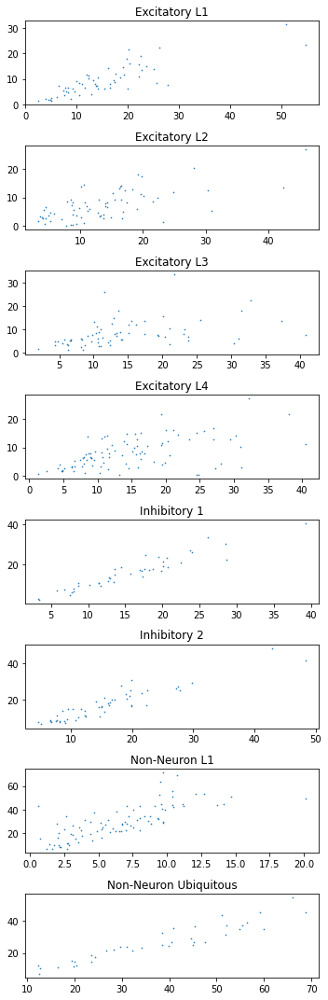

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        5.369594      4.450462       6.473138               6.473138
1        3.184249      8.420450       3.100451               3.100451
2        3.878538      7.925649       5.096630               5.096630
3        3.263167      3.125585       2.486934               2.486934
4        6.863909      5.991352       2.581040               2.581040
..            ...           ...            ...                    ...
95       1.300504      2.648455       4.222768               4.222768
96       3.682116      1.889921       4.705214               4.705214
97       3.985570      2.260616       0.571488               0.571488
98       1.330906      3.855063       2.356713               2.356713
99       3.184774      8.514791       6.990026               6.990026

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        5.369594               6.473138
1        3.184249               3.100451
2        3.

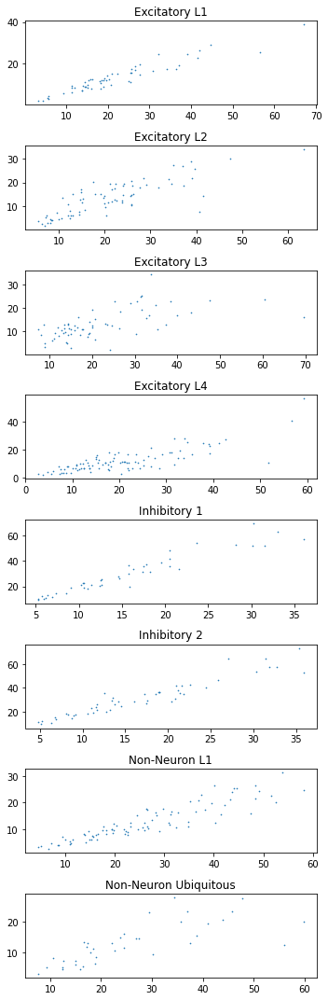

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        2.700862      4.853785       2.985930               2.985930
1        7.116260      4.715926       1.169415               1.169415
2       10.702150      3.107838       4.862472               4.862472
3        0.887932      2.689731       4.198017               4.198017
4        5.125203      3.444275       0.965628               0.965628
..            ...           ...            ...                    ...
95       2.022128      8.230777       4.996062               4.996062
96       2.123557      3.385257       5.563054               5.563054
97       0.852298      5.369516       1.451374               4.156648
98       0.793099      4.078405       5.536139               5.536139
99       3.890338      4.324905       1.170994               2.103827

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        2.700862               2.985930
1        7.116260               1.169415
2       10.

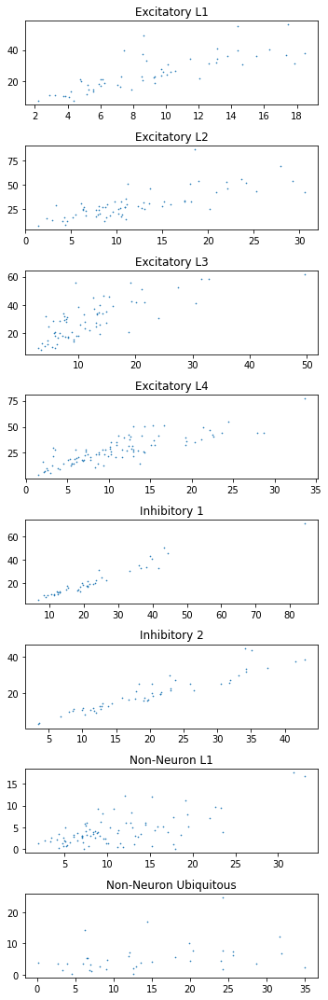

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        3.649404      5.508416       2.659154               2.659154
1        2.203515      4.381312       2.848485               2.848485
2        3.795065      2.119812       2.093720               2.093720
3        3.813091      5.958472       6.713038               6.713038
4        1.568178      1.948016       2.320152               2.320152
..            ...           ...            ...                    ...
95       3.964140      4.426949       1.861171               1.861171
96       3.326405      2.974234       2.639753               2.639753
97       4.459741      4.890731       3.241875               3.241875
98       4.200289      3.425014       1.766689               1.766689
99       3.494505      6.283722       5.587373               5.587373

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        3.649404               2.659154
1        2.203515               2.848485
2        3.

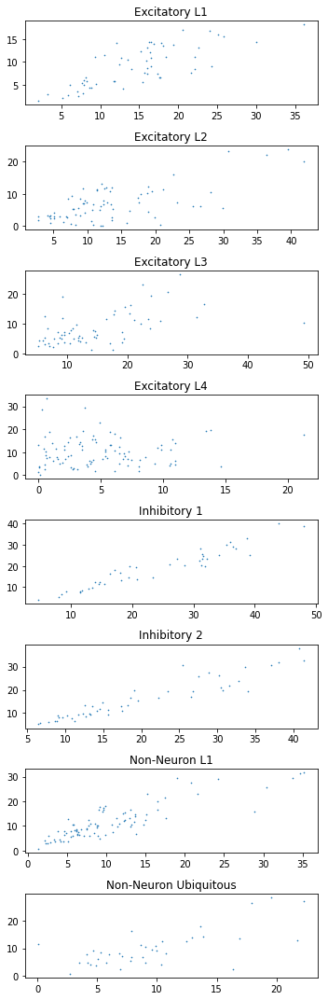

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        8.799881      1.679592       1.657875               1.657875
1        5.552022      2.637532       2.739632               2.739632
2        1.397705      2.804218       3.092078               3.092078
3        8.095595      5.391908       1.142063               2.462859
4        4.356418      3.193636       3.884897               3.884897
..            ...           ...            ...                    ...
95       2.920664      0.943539       5.728579               5.728579
96       6.958491      4.248306       3.113036               3.113036
97       4.393668      4.900423       2.014715               2.014715
98       2.381043      4.357978       4.495485               4.495485
99       4.013903      3.666733       6.632410               6.632410

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        8.799881               1.657875
1        5.552022               2.739632
2        1.

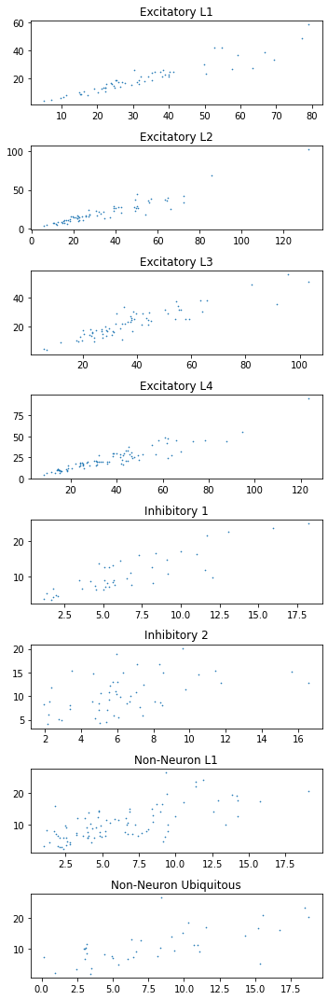

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        5.873301      2.009451       4.649971               4.649971
1        2.439678      5.694637       2.323271               2.323271
2        3.046360      5.789445       2.658357               2.658357
3        2.880399      2.093547       6.453757               4.759704
4        7.769885      4.220833       5.920099               5.920099
..            ...           ...            ...                    ...
95       2.067815      4.388339       5.374898               5.374898
96       1.116187      4.328931       9.104705               9.104705
97       1.850082      2.922421       3.807880               3.807880
98       6.426594      1.175012       7.669492               7.669492
99       2.671246      2.859087       2.659578               2.659578

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        5.873301               4.649971
1        2.439678               2.323271
2        3.

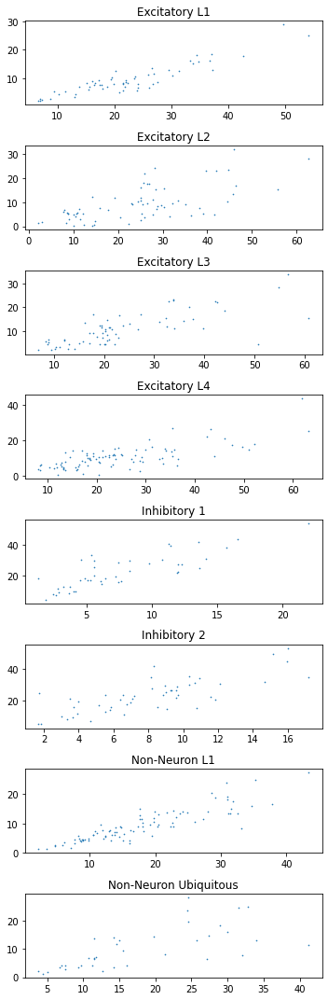

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        4.358932      3.958198       6.748411               6.748411
1        3.034908      4.313669       5.516549               5.516549
2        3.495287      3.714122       2.715976               2.715976
3        1.830044      8.654768       1.710090               1.710090
4        1.573625      1.842401       5.262805               3.393590
..            ...           ...            ...                    ...
95       2.558410      2.537594       2.287326               2.287326
96       3.789854      4.130497       2.079559               2.079559
97       8.389624      1.443161       4.916919               4.916919
98       2.200972      2.197192       1.686521               2.721893
99       6.448418      4.605153       4.607556               4.607556

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        2.598300               6.748411
1        3.034908               5.516549
2        3.

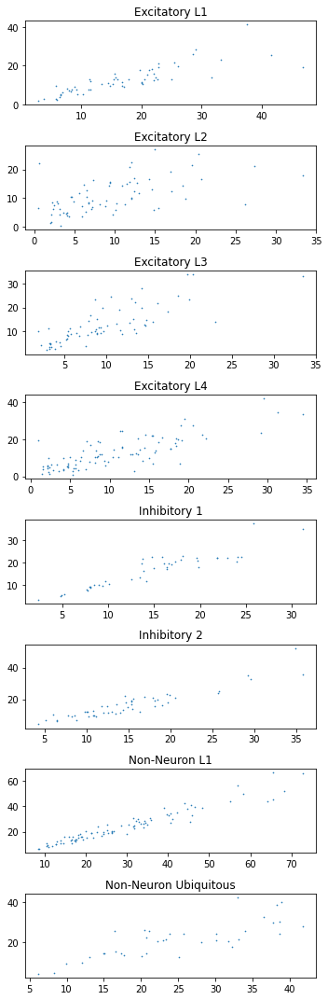

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        4.815136      0.947702       8.210350               8.210350
1        2.690597      4.599550       3.385106               3.385106
2        0.644750      4.862527      11.480101              11.480101
3        2.911192      7.428366       3.950540               3.950540
4        3.661894      6.148709       6.576836               6.576836
..            ...           ...            ...                    ...
95       4.246093      2.544263       6.844602               6.844602
96       5.467564      2.901463       6.414878               6.414878
97       5.324772      4.894703       3.972057               3.972057
98       6.189097      4.366589       3.939574               3.939574
99       1.381930      3.745694       3.391455               3.391455

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        4.815136               8.210350
1        2.690597               3.385106
2        2.

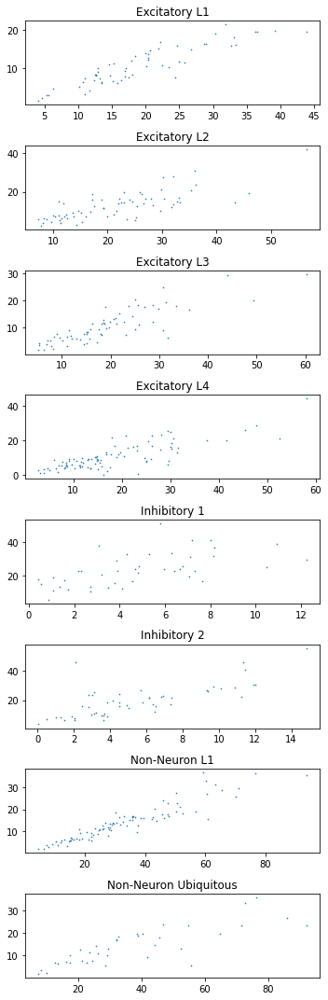

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        4.592452      2.096624       4.101413               4.101413
1        6.751864      3.172132       6.415288               6.415288
2        1.540089      5.145634       5.728260               5.728260
3        3.233029      5.128635       0.673769               0.673769
4        7.225122      4.348210       7.324901               7.324901
..            ...           ...            ...                    ...
95       1.128810      0.772599       4.586925               4.006913
96       4.209788      5.758987       1.529600               1.529600
97       4.370941      2.311016       2.383365               1.787489
98       2.984583      4.235644       3.733875               3.733875
99       5.435415      4.089398       3.544136               3.544136

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        4.592452               4.101413
1        6.751864               6.415288
2        4.

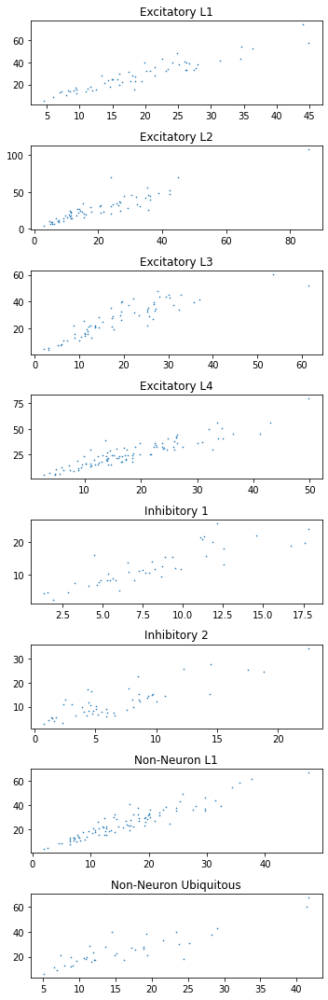

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        5.828444      4.833378       1.269458               1.269458
1        2.739765      1.981396       1.421293               1.421293
2        2.990575      1.430275       2.888594               2.888594
3        4.571433      6.809768       2.540423               2.540423
4        2.375820      3.222612       2.351040               2.351040
..            ...           ...            ...                    ...
95       2.389838      3.572111       3.592161               3.592161
96       3.646714      4.169138       3.490185               3.490185
97       3.951491      2.023679       7.013473               7.013473
98       2.709654      3.675458       3.365452               3.365452
99       1.230313      5.898041       1.912402               1.912402

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        5.828444               1.269458
1        2.739765               1.421293
2        2.

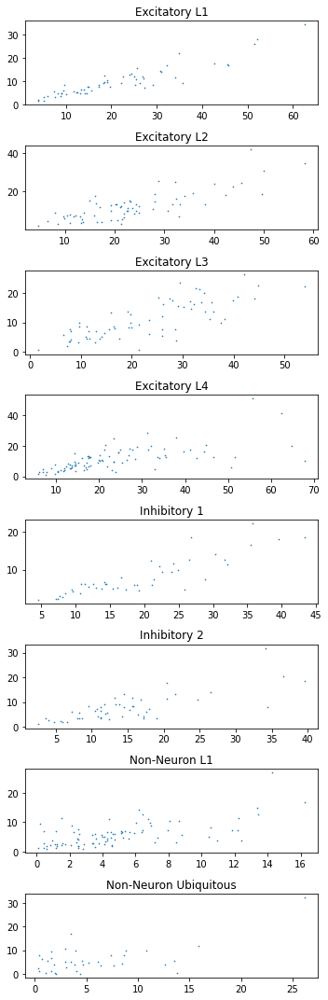

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        4.571336      5.393102       4.703490               4.703490
1        4.988754      4.772127       3.841230               3.841230
2        5.700296      2.701246       3.469806               3.469806
3        2.325829      1.172393       2.539080               2.539080
4        4.565926      4.026866       2.353259               2.353259
..            ...           ...            ...                    ...
95       8.446152      4.379547       1.164364               1.164364
96       4.381880      4.250998       3.333449               3.333449
97       2.728765      4.302397       3.064623               3.064623
98       3.535707      6.327893       6.442276               3.447402
99       3.020063      7.428230       3.233994               3.233994

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        4.571336               4.703490
1        4.988754               3.841230
2        5.

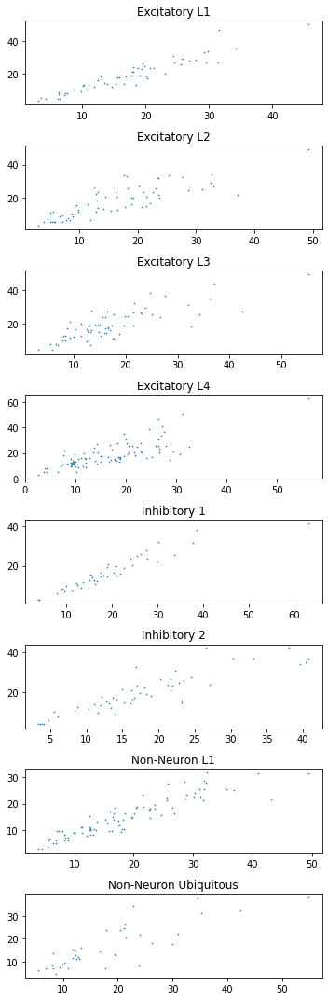

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        5.269446      4.978187       6.701785               6.701785
1        1.820658      5.369594       6.177202               6.177202
2        0.770891      3.184249       2.454298               2.454298
3        5.467801      3.878538       1.583716               2.500818
4        3.219389      3.263167       4.014919               4.014919
..            ...           ...            ...                    ...
95       1.149168      3.727657       2.633587               2.633587
96       2.764887      6.116523       2.529864               2.529864
97       2.841745      3.682116       1.882769               1.882769
98       6.600679      3.985570       4.254179               4.254179
99       5.738353      1.330906       3.523266               1.266456

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        5.269446               6.701785
1        1.820658               6.177202
2        0.

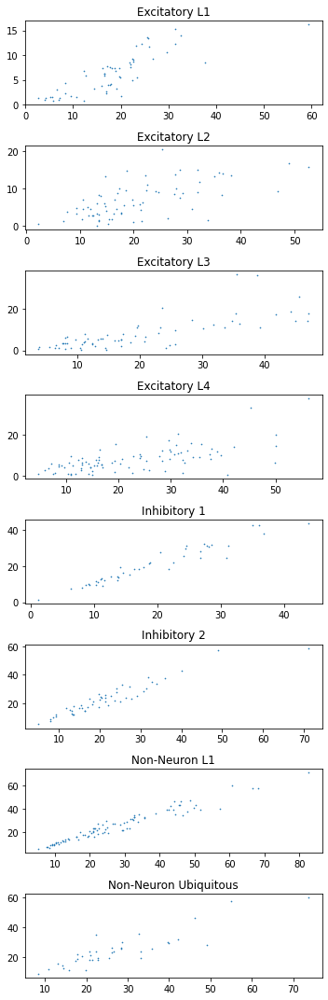

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        2.319552      5.388898       5.715678               5.715678
1        2.689829      4.996062       2.022128               2.022128
2        1.599565      5.563054       2.123557               2.123557
3        1.707260      4.156648       0.852298               0.852298
4        1.229655      5.536139       2.830861               0.793099
..            ...           ...            ...                    ...
95       2.512579      1.527549       5.110171               5.110171
96       5.235514      6.389778       3.613274               3.613274
97       5.473249      1.210607       4.012041               4.012041
98       1.211014      1.116570       4.397935               4.397935
99       2.370364      6.747292       2.794062               2.794062

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        2.319552               5.715678
1        2.689829               2.022128
2        1.

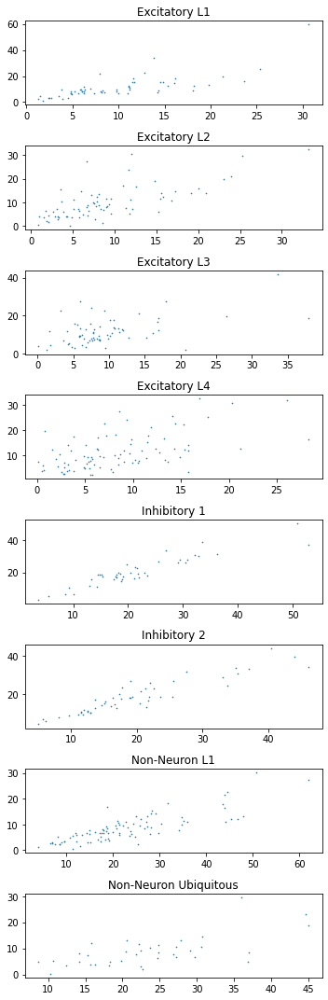

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        1.175157      2.491147       3.528534               3.528534
1        1.408852      1.937981       4.650948               4.650948
2        4.870690      1.861171       3.964140               3.964140
3        3.313825      2.639753       3.326405               3.326405
4        2.455044      3.241875       4.551198               4.551198
..            ...           ...            ...                    ...
95       4.420174      5.323765       2.163019               2.163019
96       2.847764      2.218214       3.615790               3.615790
97       3.041868      3.414818       4.688047               4.688047
98       6.509937      2.574276       1.362023               1.362023
99       3.224362      3.829634       4.264438               3.303860

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        1.175157               3.528534
1        1.408852               4.650948
2        4.

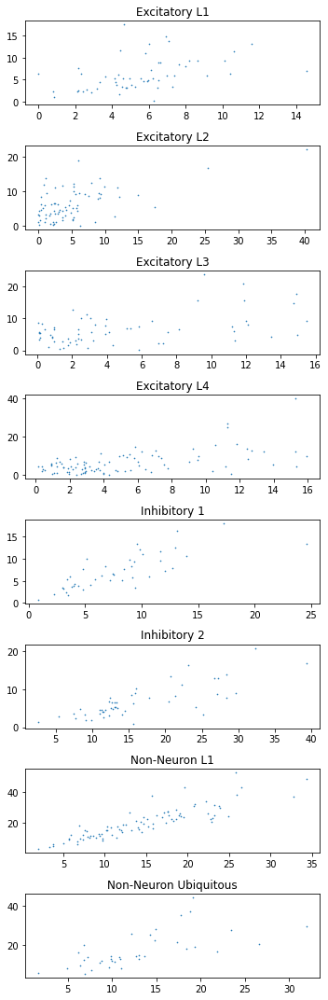

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        2.650673      7.802037       1.768079               1.768079
1        3.568399      3.204905       4.393668               4.393668
2        1.347160      2.083419       5.271762               5.271762
3        0.993529      3.619991       1.471612               1.471612
4        4.677273      8.799881       6.114242               4.190650
..            ...           ...            ...                    ...
95       4.707084      2.023237       7.505794               7.505794
96       5.517982      3.015704       2.331895               2.331895
97       1.786577      2.831946       6.432308               6.432308
98       4.271915      1.108994       4.172699               4.172699
99       5.992345      2.920664       5.006396               5.006396

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        5.330950               1.768079
1        3.568399               4.393668
2        1.

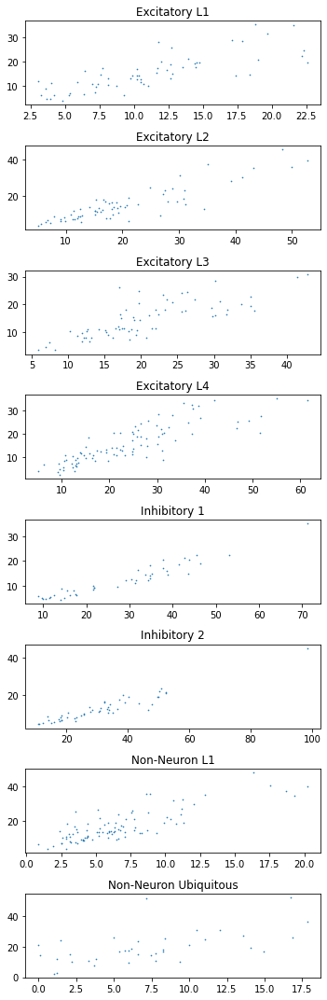

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        3.488231      3.476359       3.107747               3.107747
1        1.366373      2.685924       2.056402               2.056402
2        9.170641      6.419828       1.116187               1.116187
3        3.230534      5.873301       2.864092               2.864092
4        5.331052      2.439678       3.023243               3.023243
..            ...           ...            ...                    ...
95       2.628507      5.801117       1.989777               1.989777
96       1.606529      3.976452       8.659943               8.659943
97       2.819089      0.942800       4.530356               4.530356
98       4.006007      2.067815       4.266479               4.266479
99       3.351108      7.176905       3.767883               2.342248

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        3.488231               3.107747
1        1.366373               2.056402
2        9.

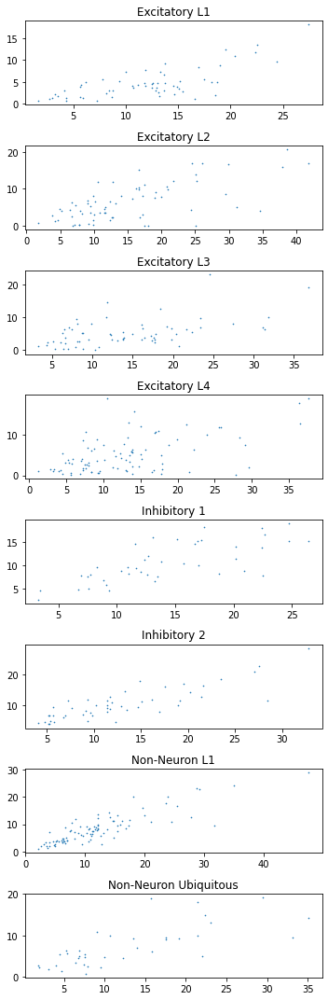

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        2.057308      2.241234       5.554541               5.554541
1        3.496978      3.307105       4.407470               4.407470
2        6.278818      2.827679       3.642175               3.642175
3        4.137506      4.229702       5.007327               5.007327
4        5.209051      1.798700       4.506462               4.506462
..            ...           ...            ...                    ...
95       1.310157      4.423403       8.833257               8.833257
96       3.817437      2.155977       2.978713               2.978713
97       2.888757      3.652227       2.617004               2.617004
98       4.012953      4.505369       3.801431               6.654981
99       7.650194      4.358932       2.630413               2.630413

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        2.057308               5.554541
1        3.496978               4.407470
2        6.

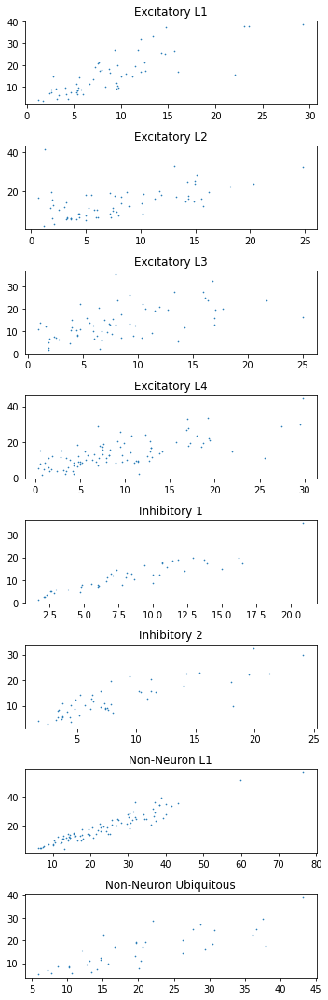

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        3.287484      8.009464       5.984241               5.984241
1        1.721214      3.925382       5.639972               5.639972
2        1.261023      5.767085       5.969193               5.969193
3        2.507615      8.223147       3.708668               3.708668
4        5.219693      2.208461       7.003098               7.003098
..            ...           ...            ...                    ...
95       5.092964      5.151382       2.086372               2.086372
96       9.573382      3.038883       7.167451               7.167451
97       3.483694      3.165623       8.608517               8.608517
98       4.772702      2.571265       3.337269               3.337269
99       4.314956      2.658281       3.018512               1.343530

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        3.287484               5.984241
1        1.721214               5.639972
2        1.

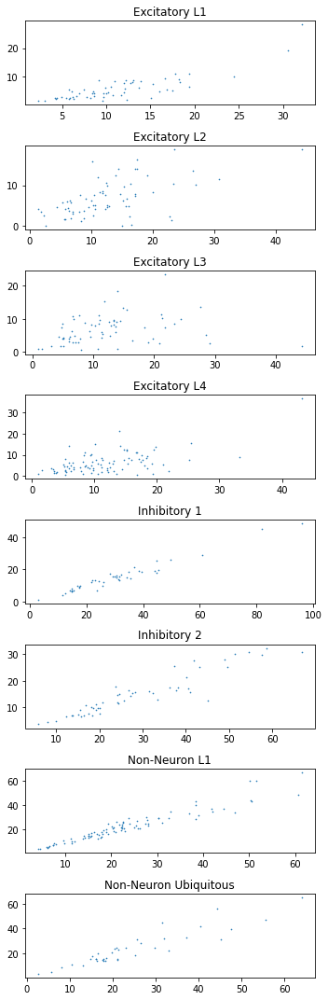

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        1.478444      6.729391       1.171302               1.171302
1        4.080814      2.558959       2.189704               2.189704
2        2.240859      4.328887       2.001761               2.001761
3        7.043337      4.975166       3.859914               3.859914
4        2.856313      2.682120       6.972296               6.972296
..            ...           ...            ...                    ...
95       4.369662      1.991722       2.604248               2.604248
96       4.125799      7.027069       3.203589               3.203589
97       3.488284      2.191495       1.607158               1.607158
98       2.533295      2.805199       2.057402               2.057402
99       3.530759      5.077694       6.458432               6.458432

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        1.478444               1.171302
1        4.080814               2.189704
2        2.

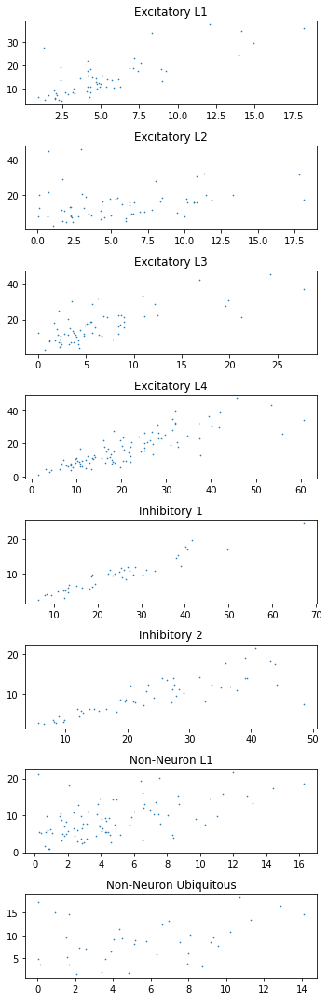

[    Excitatory L1  Inhibitory 1  Non-Neuron L1  Non-Neuron Ubiquitous
0        6.319700      1.316088       5.043866               5.043866
1        4.399007      6.891511       2.857649               2.857649
2        2.122687      3.592161       2.389838               2.389838
3        7.669150      3.490185       3.646714               3.646714
4        5.197336      7.013473       3.951491               3.951491
..            ...           ...            ...                    ...
95       2.354167      4.245664       6.517922               2.282478
96       4.627088      6.511120       1.617677               1.617677
97       1.871605      5.144242       4.173645               4.173645
98       2.739722      2.717879       4.276390               4.276390
99       2.511951      2.256586       4.308300               4.308300

[100 rows x 4 columns],     Excitatory L2  Non-Neuron Ubiquitous
0        6.319700               5.043866
1        4.399007               2.857649
2        2.

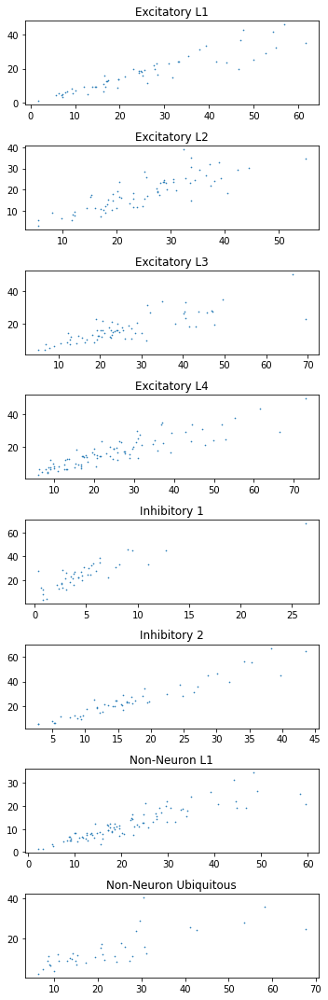

In [13]:
for dataset in datasets:
    print(dataset.cell_type_definitions)
    dataset.plot_feature_by_cell_type(s=0.4)

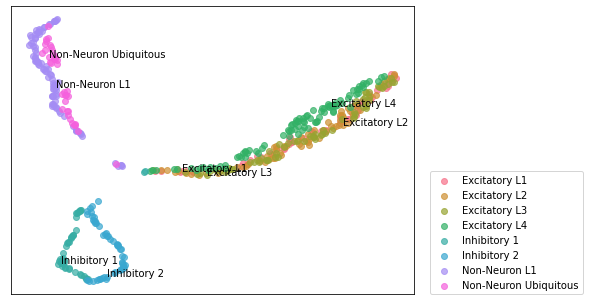

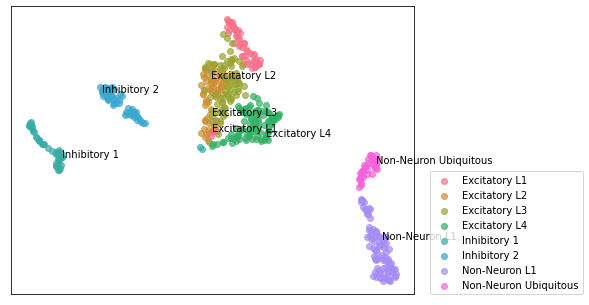

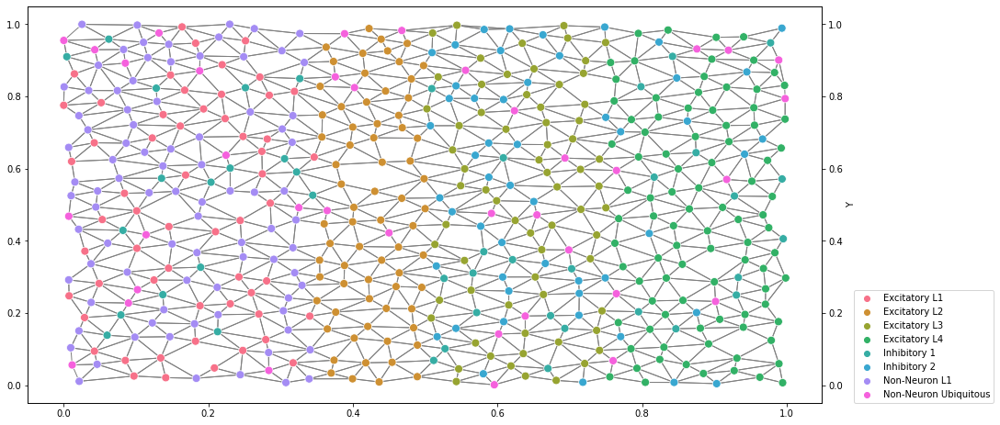

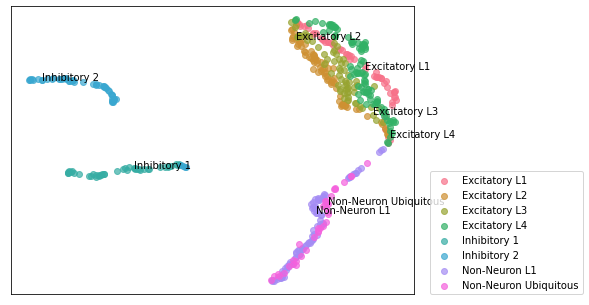

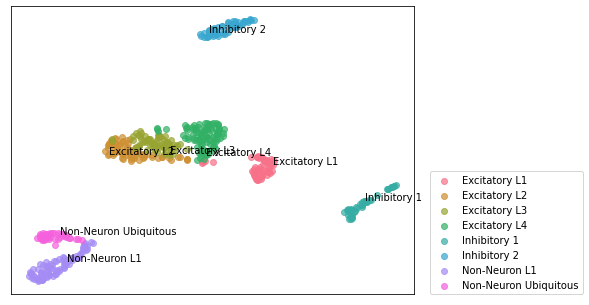

...

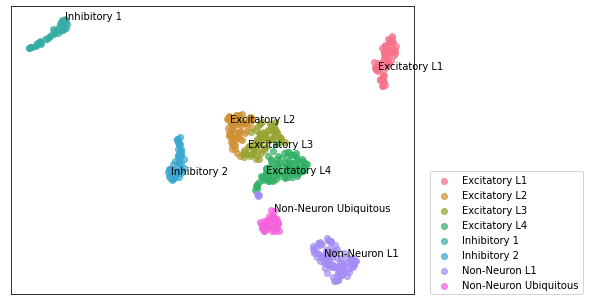

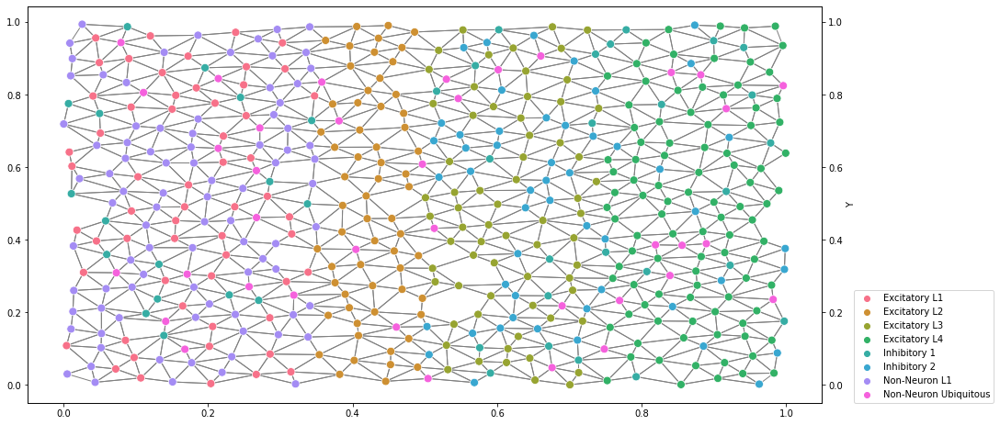

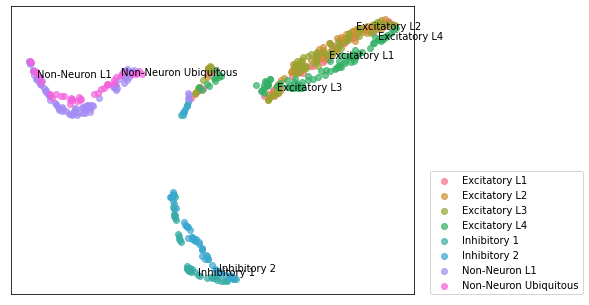

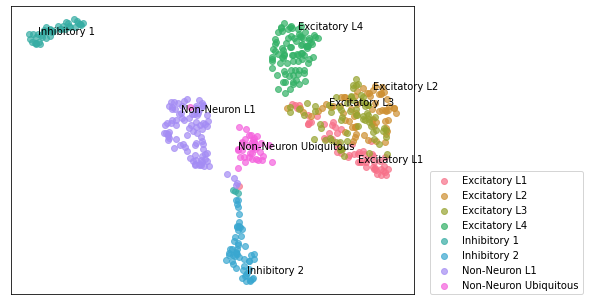

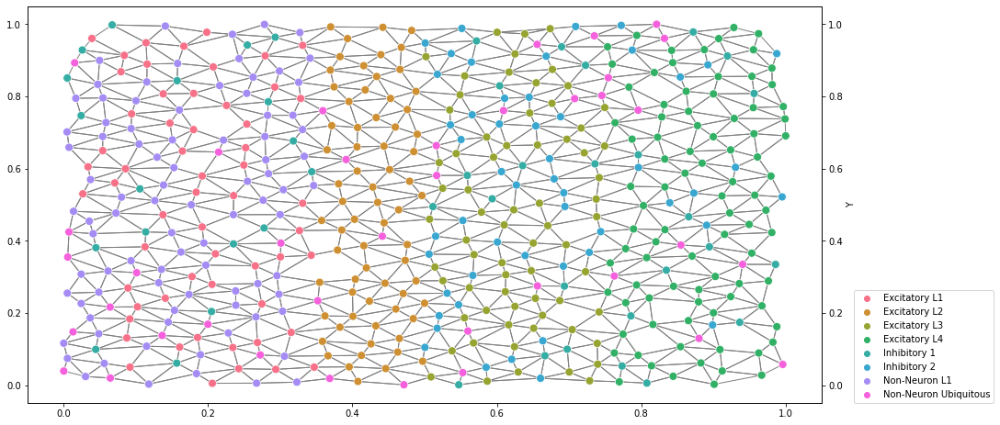

In [14]:
for dataset in datasets:
    dataset.plot_cells_UMAP(latent_space=False, annotate=True)
    dataset.plot_cells_UMAP(latent_space=True, annotate=True)
    dataset.plot_cell_types()

In [23]:
rng = np.random.default_rng(12345)

num_genes = 2
num_cells = 100000
random_integers = rng.integers(low=0, high=1, size=num_genes)
random_values = np.zeros((num_cells, num_genes))
covariance_matrix = 0.05 * np.identity(num_genes)
covariance_matrix[0, 1], covariance_matrix[1, 0] = 0.02, 0.00
for cell in range(num_cells):
    random_values[cell] = sample_gaussian(covariance_matrix, random_integers)

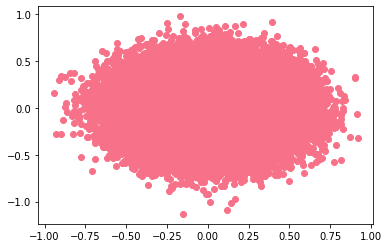

In [24]:
import matplotlib.pyplot as plt
x, y = random_values.T
plt.scatter(x, y)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


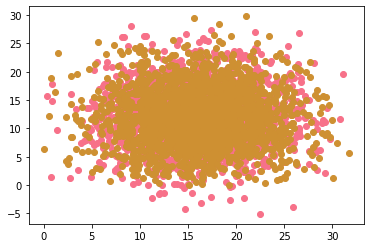

In [25]:
rng = np.random.default_rng(12345)

num_genes = 100
num_cells = 2000
random_integers = rng.integers(low=10, high=20, size=num_genes)
covariance_matrix = 25 * np.identity(num_genes)
covariance_matrix[0, 1], covariance_matrix[1, 0] = 0.02, 0.02
random_values = sample_truncated_gaussian(covariance_matrix, random_integers, num_cells, num_steps=1000)

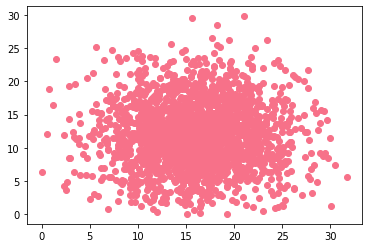

In [26]:
import matplotlib.pyplot as plt
x, y = random_values.T[:2]
plt.scatter(x, y)